<a href="https://colab.research.google.com/github/JanetDev/Practica3.2_AYVDD/blob/main/Practica3_2AYVDD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
datos=pd.read_csv('/content/drive/MyDrive/Praticas/kc_house_data.csv')
datos.head(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [ ]:
datos=datos.drop(['id', 'date'], axis=1)

## Coeficiente de Correlacion

In [ ]:
# Para las sumas y productos
resultados = {}

n = len(datos)

# Crear una lista de nombres de columnas
columnas = list(datos.columns)

#guardar las correlaaciones
r = []

for i in range(len(columnas)):
    for j in range(i + 1, len(columnas)):
        columna_x = columnas[i]
        columna_y = columnas[j]

        # Sumas y productos
        sum_x = sum(datos[columna_x])
        sum_y = sum(datos[columna_y])
        sum_x_2 = sum(x ** 2 for x in datos[columna_x])
        sum_y_2 = sum(y ** 2 for y in datos[columna_y])
        sum_xy = sum(x * y for x, y in zip(datos[columna_x], datos[columna_y]))

        # Almacenamos en el diccionario
        clave = f'{columna_x}_vs_{columna_y}'
        resultados[clave] = {
            'Sum_x': sum_x,
            'Sum_y': sum_y,
            'Sum_x_2': sum_x_2,
            'Sum_y_2': sum_y_2,
            'Sum_xy': sum_xy,
            'N': n
        }

# Calculamos el coeficiente de correlación
for clave, valores in resultados.items():
    n = valores['N']
    sum_x = valores['Sum_x']
    sum_y = valores['Sum_y']
    sum_x_squared = valores['Sum_x_2']
    sum_y_squared = valores['Sum_y_2']
    sum_xy = valores['Sum_xy']

    # Calcular el coeficiente de correlación de Pearson
    numerador = n * sum_xy - sum_x * sum_y
    denominador = ((n * sum_x_squared - sum_x ** 2) * (n * sum_y_squared - sum_y ** 2)) ** 0.5
    coeficiente_correlacion = numerador / denominador
    r.append(coeficiente_correlacion)

    # Imprimir el coeficiente de correlación para cada par de variables
    print(f'Coeficiente de correlación de Pearson para {clave}: {coeficiente_correlacion}')

Coeficiente de correlación de Pearson para price_vs_bedrooms: 0.3083495981456393
Coeficiente de correlación de Pearson para price_vs_bathrooms: 0.5251375054139635
Coeficiente de correlación de Pearson para price_vs_sqft_living: 0.7020350546118025
Coeficiente de correlación de Pearson para price_vs_sqft_lot: 0.0896608605871004
Coeficiente de correlación de Pearson para price_vs_floors: 0.25679388755071925
Coeficiente de correlación de Pearson para price_vs_waterfront: 0.266369434030603
Coeficiente de correlación de Pearson para price_vs_view: 0.3972934882945055
Coeficiente de correlación de Pearson para price_vs_condition: 0.036361789128997665
Coeficiente de correlación de Pearson para price_vs_grade: 0.6674342560202391
Coeficiente de correlación de Pearson para price_vs_sqft_above: 0.6055672983560798
Coeficiente de correlación de Pearson para price_vs_sqft_basement: 0.323816020711985
Coeficiente de correlación de Pearson para price_vs_yr_built: 0.05401153149479249
Coeficiente de correl

# Con librerias

In [ ]:
matriz_correlacion = datos.corr()

print("Matriz de correlación:")
print(matriz_correlacion)

Matriz de correlación:
                  price  bedrooms  bathrooms  sqft_living  sqft_lot    floors  \
price          1.000000  0.308350   0.525138     0.702035  0.089661  0.256794   
bedrooms       0.308350  1.000000   0.515884     0.576671  0.031703  0.175429   
bathrooms      0.525138  0.515884   1.000000     0.754665  0.087740  0.500653   
sqft_living    0.702035  0.576671   0.754665     1.000000  0.172826  0.353949   
sqft_lot       0.089661  0.031703   0.087740     0.172826  1.000000 -0.005201   
floors         0.256794  0.175429   0.500653     0.353949 -0.005201  1.000000   
waterfront     0.266369 -0.006582   0.063744     0.103818  0.021604  0.023698   
view           0.397293  0.079532   0.187737     0.284611  0.074710  0.029444   
condition      0.036362  0.028472  -0.124982    -0.058753 -0.008958 -0.263768   
grade          0.667434  0.356967   0.664983     0.762704  0.113621  0.458183   
sqft_above     0.605567  0.477600   0.685342     0.876597  0.183512  0.523885   
sqft_

# **Graficas**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
r

[0.3083495981456393,
 0.5251375054139635,
 0.7020350546118025,
 0.0896608605871004,
 0.25679388755071925,
 0.266369434030603,
 0.3972934882945055,
 0.036361789128997665,
 0.6674342560202391,
 0.6055672983560798,
 0.323816020711985,
 0.05401153149479249,
 0.1264337934408934,
 -0.05320285429837515,
 0.30700348002085753,
 0.021626241002166938,
 0.5853789035795695,
 0.08244715251948624,
 0.5158836376158301,
 0.5766706925022441,
 0.031703242944930654,
 0.1754289352199399,
 -0.006582478665781522,
 0.07953185183706284,
 0.028472104429203237,
 0.35696672535960594,
 0.47760016142913636,
 0.3030933753206627,
 0.15417806945248536,
 0.018840823118937113,
 -0.15266848681030878,
 -0.008931009686071413,
 0.12947297515885867,
 0.39163752396882356,
 0.02924422364558995,
 0.7546652789673735,
 0.08773966153126195,
 0.5006531725878705,
 0.06374362913563693,
 0.18773702397664163,
 -0.12498193347933241,
 0.6649825338780712,
 0.685342475876159,
 0.2837700340046687,
 0.5060194382852533,
 0.05073897764805956,


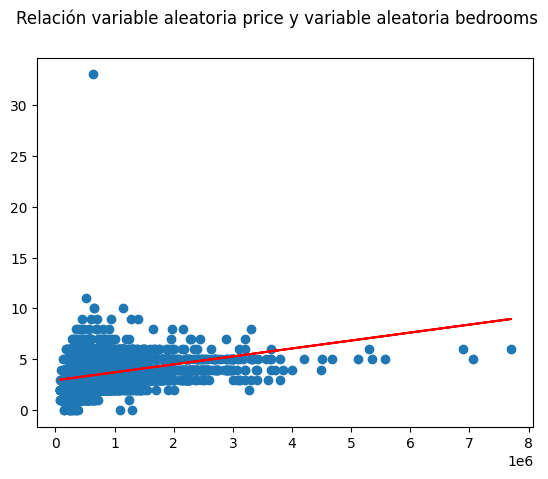

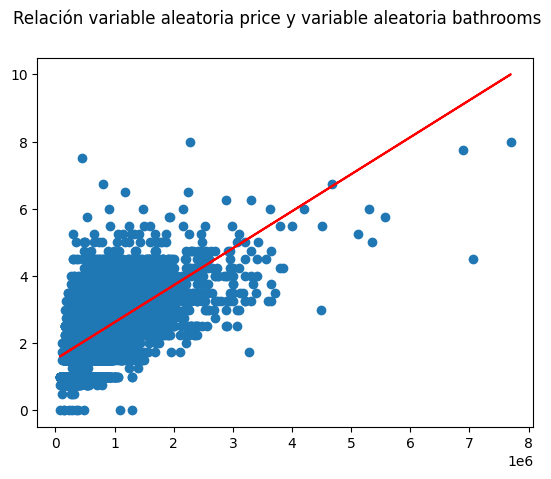

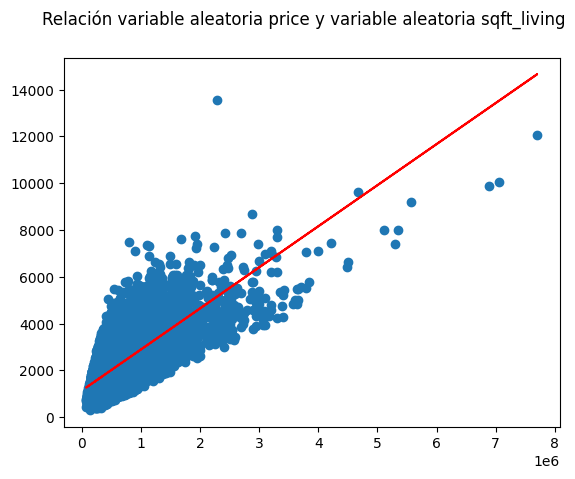

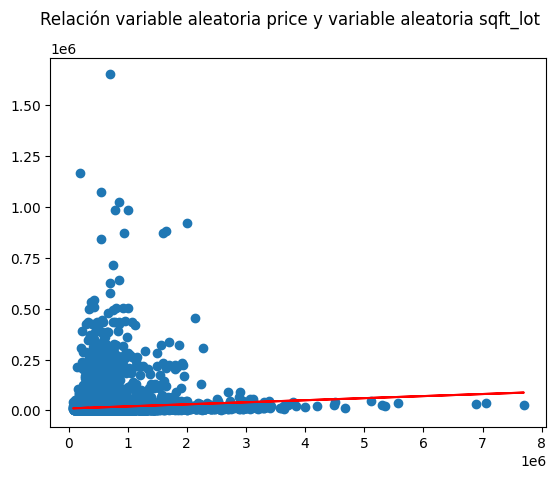

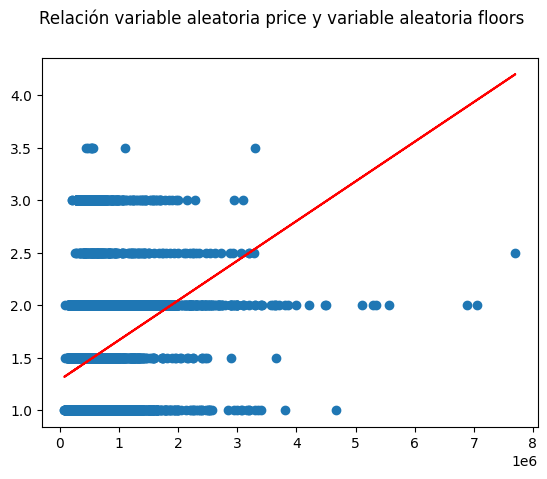

...

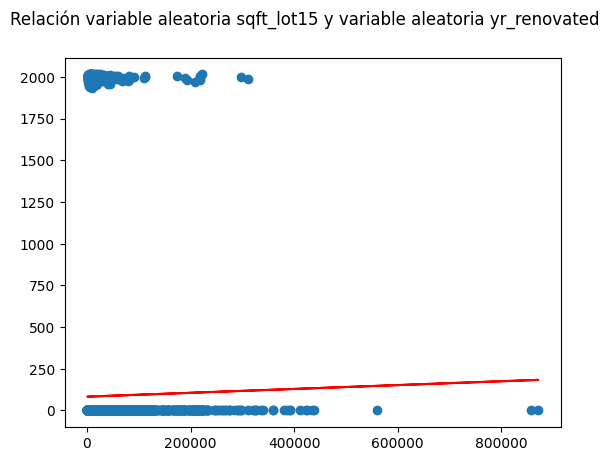

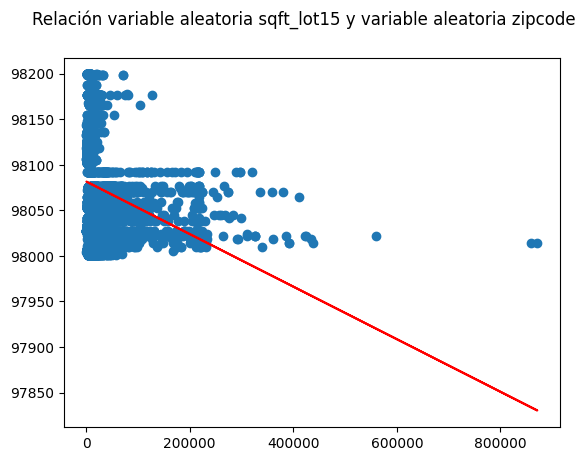

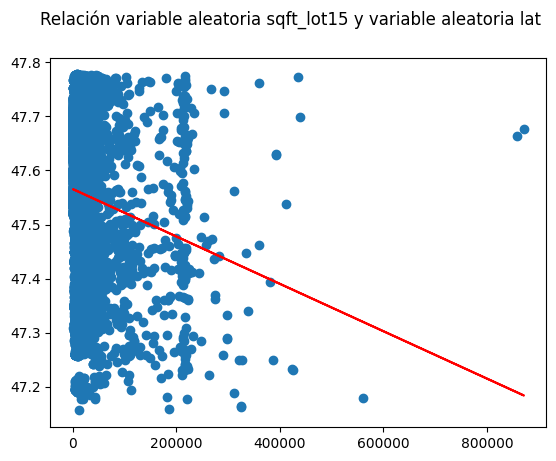

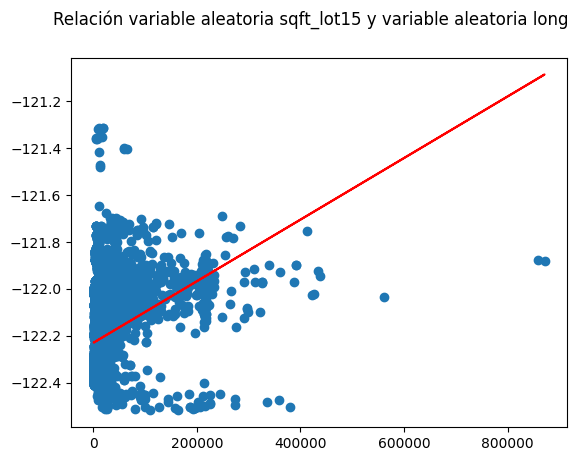

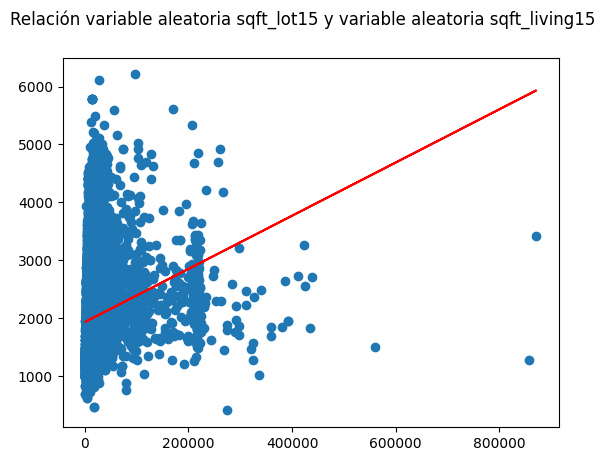

In [ ]:
def graficas(datos, r):
    for i in datos.columns:
        for j in datos.columns:
            if j != i:
                fig, ax = plt.subplots()
                ax.scatter(x=datos[i], y=datos[j])
                slope, intercept = np.polyfit(datos[i], datos[j], 1)
                line = slope * np.array(datos[i]) + intercept
                plt.plot(datos[i], line, color='red')
                fig.suptitle(f'Relación variable aleatoria {i} y variable aleatoria {j}')

                if len(r) > 0:
                    coeficiente_correlacion = r.pop(0)
                    plt.title(f'Coeficiente de correlación de Pearson: {coeficiente_correlacion}')
                else:
                    plt.show()

graficas(datos, r)